# Transformer from scratch

## Overview

- **Input**
    - An **array of real numbers** 
        - ex. a list of numbers, 2D array, higher dimension array (tensor)
    - Thought of as: progressively transformed into many distinct layers (each layer is an array of real numbers), until gets to the final layer (output)

    ex. Final layer in text-processing model (ex. GPT) is a list of numbers representing the probability distribution of all possible next words that can come next in the generating text

- **Desired output:**
    - A probability distribution over all tokens that might come next

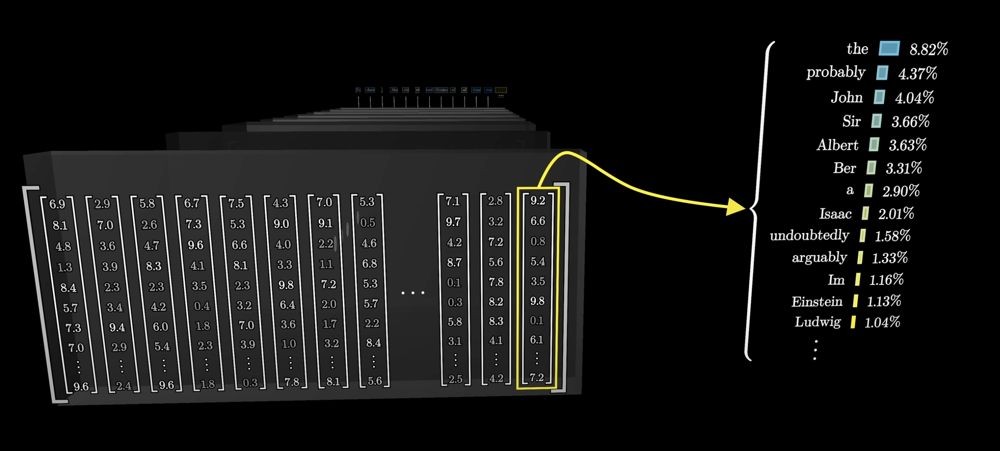

In [3]:
from IPython.display import Image, display
display(Image(filename='assets/4-outputEX.png', width=500, height=500))

## Tokens

Tokens are "little pieces" of information (ex. words, combinations of words, sounds, images). 
- Every token is associated with a vector (some list of numbers)
    - encodes the *meaning* of that piece
- ex. in considering these vectors as coordinates, words with similar meanings tend to land near each other

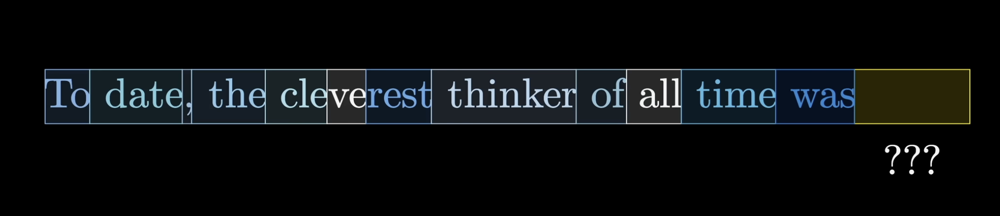

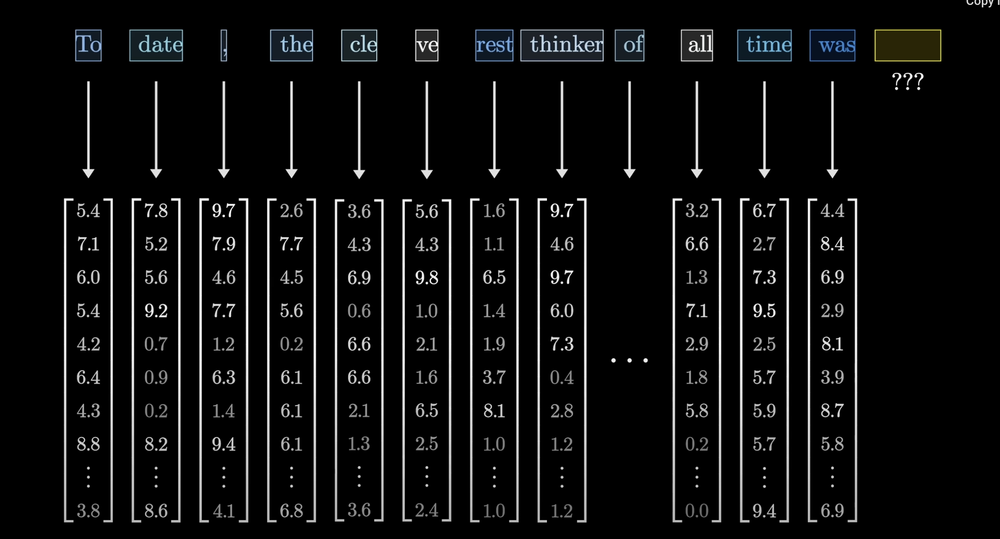

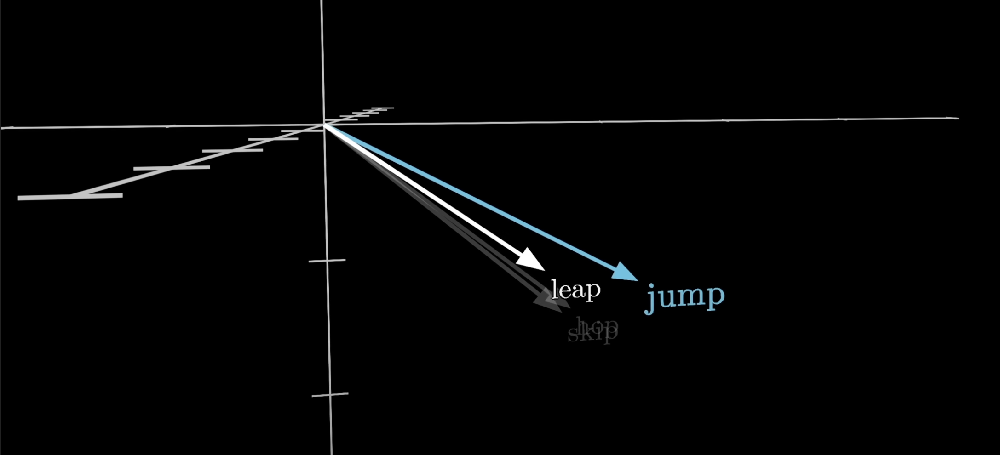

In [4]:
from IPython.display import Image, display
display(Image(filename='assets/2-tokens.png', width=500, height=500))
display(Image(filename='assets/3-tokenvectors.png', width=500, height=500))
display(Image(filename='assets/1-coordinateTokens.png', width=500, height=500))

## Embeddings

**Words that are used and occur in the same context tend to purport similar meanings (distributional semantics)**

Break up the input into little chunks, then into vectors. These chunks are called **tokens**

The model has predefined vocabulary (list of all possible words)
- Embedding matrix (W_E): single column for each word

- The dimensions of the embedding space can be very high (ex. 12,288) 

- theoretically, *E(man) - E(woman) ~= E(king) - E(queen)*

- the dot product of two vectors, is a measure of how well they align. In this case, this acts as a measure of ismilarity between two words

*see `embedding_notes.ipynb` for more on embeddings!*

*Below is an image of the embedding matrix. Each word corresponds to a specific vector, with no reference to its context.* <br>
*It is the `Attention block`'s responsibility to update a word's vector with its context. (to be discussed later)*

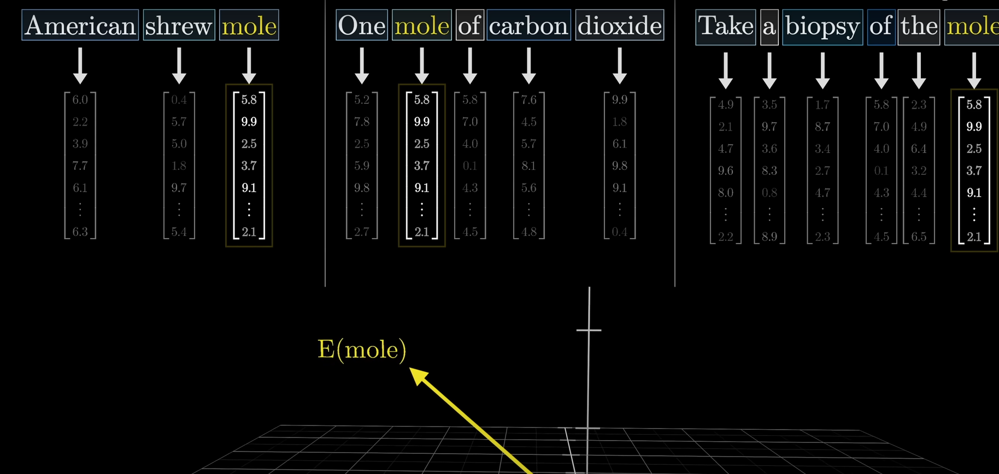

In [5]:
display(Image(filename='assets/10-embeddingmatrix.png', width=700, height=700))

### Positional Encoders

Positional encoding provides info about the **order of tokens in a sequence**. 
- ex. Where a specific word is positioned in a sentence.

A **fixed** positional encoding **vector** is **added to each word's embedding.**


*NOTE: word embeddings & positional embeddings are separate. Word embeddings capture SEMANTIC MEANING, while positional encodings capture the ORDER of tokens*

### Unembedding

In determining desired output of the transformer (a probability distribution of all possible tokens that can come next in the generating text), a well trained network on the particular dataset is able to determine the next best possible token by:

1. Using a matrix (embedding matrix `W_u`) that maps the last vector/embedding in the context to a list of 50k values (one for each token in the vocabulary)
2. Function that normalizes this into a probability distribution (`softmax`)

## Softmax (normalization)

The desired output of a transformer is a **probability distribution** of all possible tokens that can come next in the generating text

A probability distribution is defined as a **sequence of numbers between 0-1, and that sums to 1**. `Softmax` can give any sequence of numbers these criterias

In [6]:
import numpy as np

# given a sequence of numbers, each term `i`

# softmax eqn:      e^i/(sum of e^i for all terms)     

# probability distribution: 
    # 1) all numbers are positive numbers 0-1  (e^i)  
    # sum of all numbers = 1 (sum of e^i of all terms)

seq = [2, 4, 5]
print(np.exp(seq)/np.sum(np.exp(seq)))

[0.03511903 0.25949646 0.70538451]


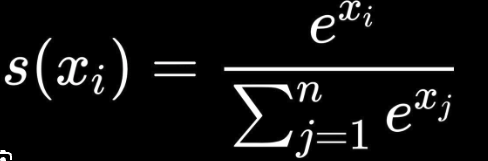

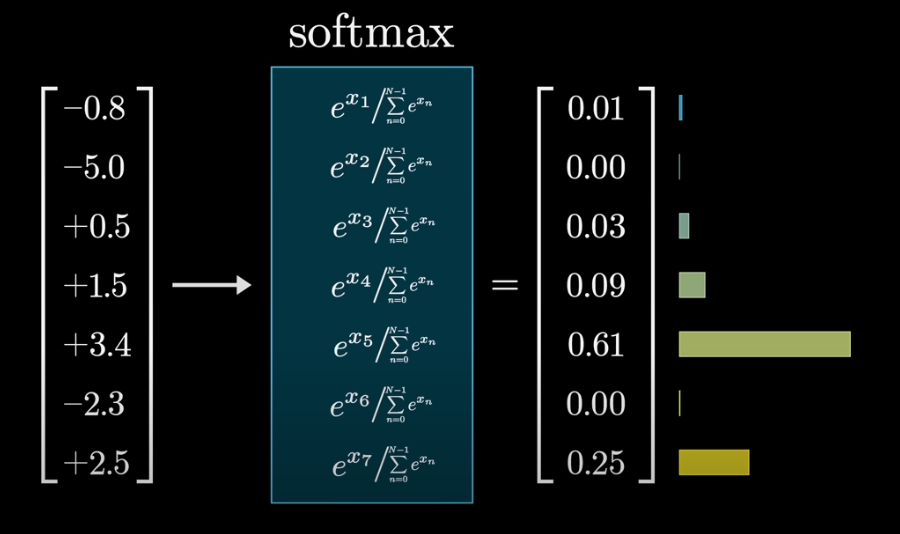

In [7]:
display(Image(filename='assets/8-softmaxEqn.png', width=700, height=700))
display(Image(filename='assets/6-softmax.png', width=700, height=700))

### Temperature

With softmax, the constant `T` added to the denominator of the exponents of `e` in the equation can cause more creative generated text
- Makes the **softmax outputs LESS extreme towards 0 and 1**
    - This enables more unique text to be generated and different for each generation

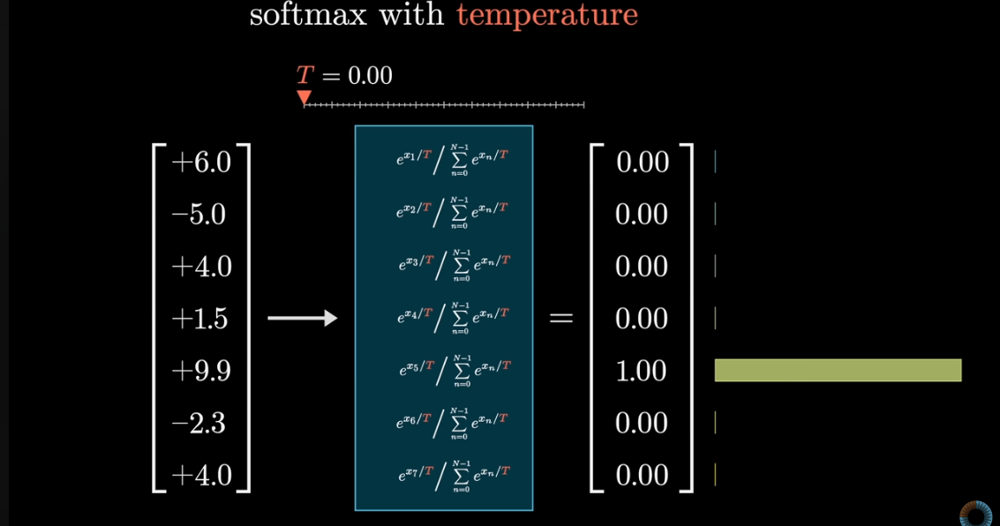

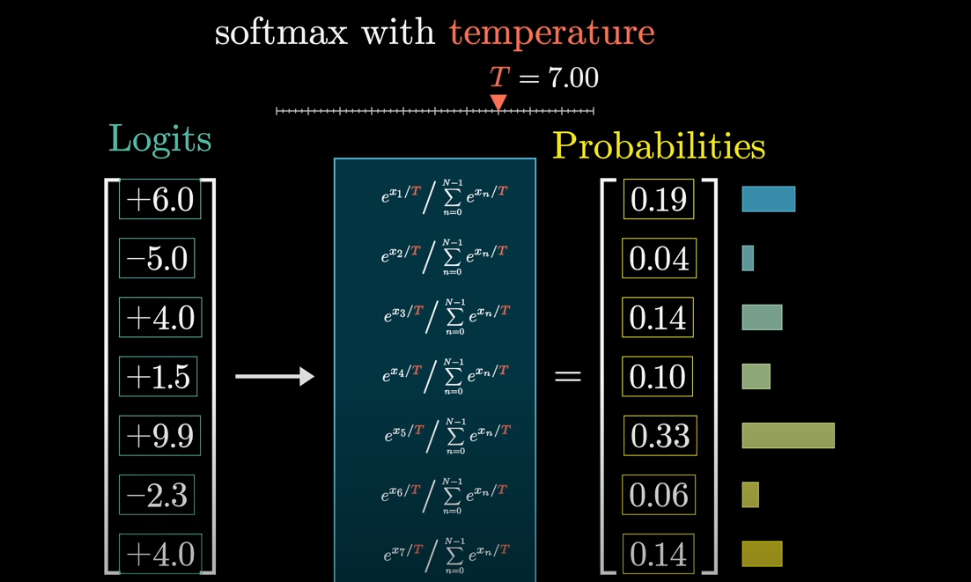

In [8]:
display(Image(filename='assets/7-softmaxT.png', width=600, height=600))
display(Image(filename='assets/9-logits.png', width=600, height=600))


## Attention

Goal: enable the model to focus on **different parts** of the input sequence when producing an output for a specific token

### Attention Score

A value that represents how much focus (or attention) one word should give to another word in the sequence
<br><br>
*(Its derivation is explained later)*

## Attention Block

Updates a word's embedding vector in reference to its context. Enables the transfer of information from one embedding to another
<br><br>
Prior to Attention, the embedding vector of each word is consistent, regardless of its context (embedding matrix, see below). Therefore, the motivation of Attention is to update a word's embedding vector depending on its context (i.e. surrounding tokens) to capture *this* specific contextual instance of the word


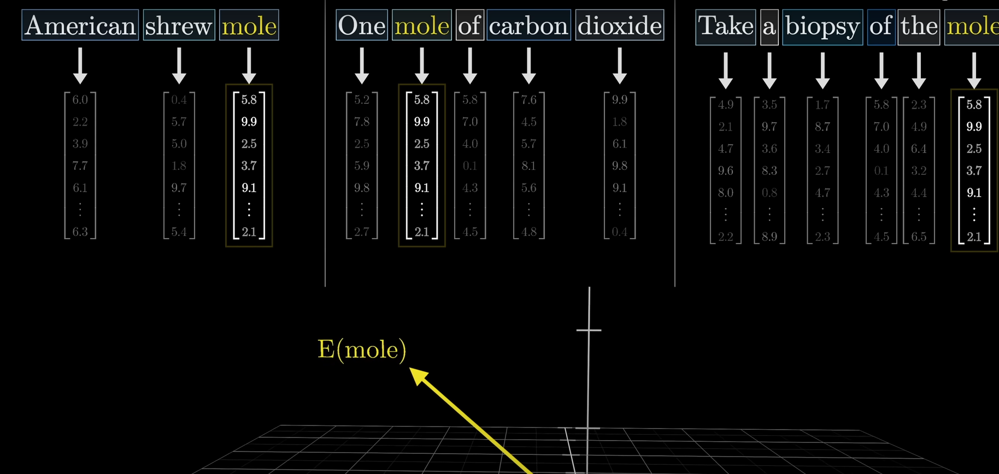

In [9]:
display(Image(filename='assets/10-embeddingmatrix.png', width=700, height=700))

The computation to predict the next token relies entirely on the **final vector of the current sequence**<br><br>
Initially, this vector corresponds to the embedding of the last word in the sequence. As the sequence passes through the model's attention blocks, the final vector is updated to include information from the entire sequence, not just the last word. This updated vector becomes a summary of the whole sequence, encoding all the important information needed to predict the next word

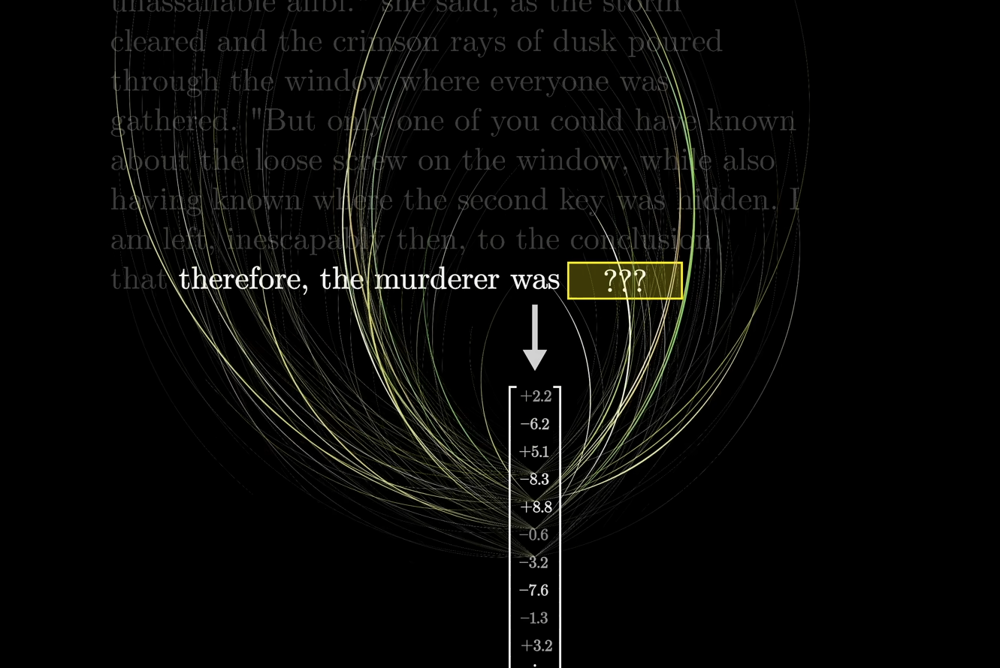

In [10]:
display(Image(filename='assets/12-attentionlastvector.png', width=700, height=700))

### Single-Head Attention

Goal: series of computations to produce a **new refined set of embeddings**t
- ex. Have nouns ingest the meanings of their correspondings adjectives


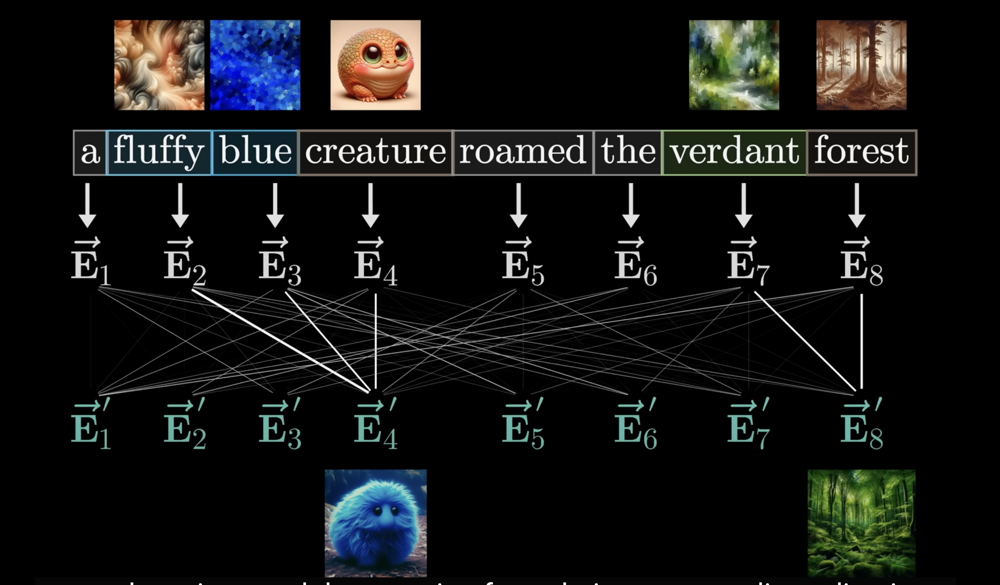

In [11]:
display(Image(filename='assets/13-attentionEmbeds.png', width=700, height=700))

### Query

- `Query`: represents the "question"/"focus" that the single-head attention is asking about the current word
    - ex. if the current word is *"cat"* in the sentence "The cat sat on the mat", the Query for "cat" might be asking, "Which other words (Keys) in this sentence should I focus on to understand *cat* better?"

### Key
- `Key`: serves as a criterion/reference point against which the Query is compared to determine the relevance of each word
    - **helps the model understand which other words are related/important to the current word  by evaluating how similar/relevant they are to the Query**
    - ex. in the sentence "The cat sat on the mat", the Key for *"sat"* might contain info that represents the action/verb aspect of the sentence. 
        - the Query for "cat" might compare itself to this Key to determine that "sat" is relevant to understanding the action associated with "cat"
### Attention Score
- `Attention Score`: tells us how relevant each word is 
    - i.e. value that represents how much focus/attention one word (Query) should give to another word in the sequence (Key)
        - computed by comparing the **Query** vector of the current word with the **Key** vectors of all other words (including itself) in the sequence
    - score indicates relevance/importance to each word in the current word
    <br><br>
    - calculated as: the **dot product between the Query and Key vectors**
        - **higher dot product: Key is more "relevant" to Query**
            - This means the model gives more weight to the Value vector of that word when forming the final representation of the Query word
                - ex. in the sentence "The cat sat on the mat," the word "cat" would have a higher influence on the final understanding of "sat" if the model finds "cat" relevant to "sat" based on their Query-Key relationship



**Input: Query, Key and Value matrices<br>**

**Output: matrix where each vector is the weighted sum of the Value vectors, where 
        the weights come from the attention scores (which are based on the dot product of the Query and Key matrices)**

Steps:<br>
1. Create weight matrices (intialized randomly initally. same dimensions as embeddings)
2. Get Query, Key values from embed.py (i.e. linear transformation applied to the vectors of the (word embeddings & positional encoding) with weight matrices, for each token)
3. Calculate the attention score (dot product of the Query and Key matrices)
4. Apply masking to the attention scores
5. Apply softmax to the (masked) attention scores (this is called normalization)
6. Use attention scores to weight the Value vectors
7. Output step 6.


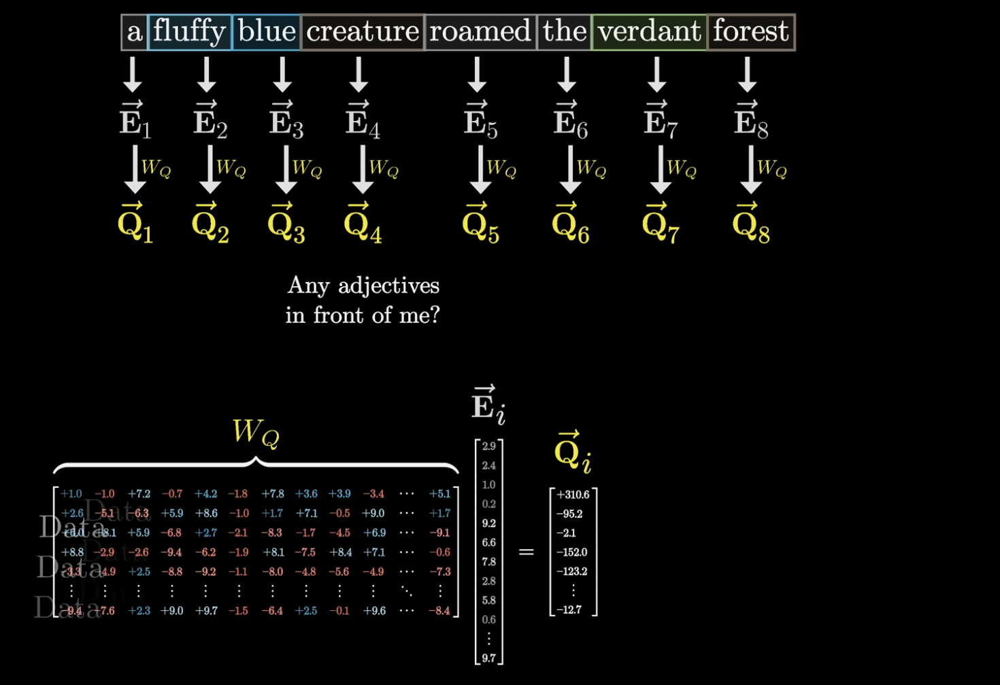

In [12]:
display(Image(filename='assets/14-queryW1.png', width=700, height=700))

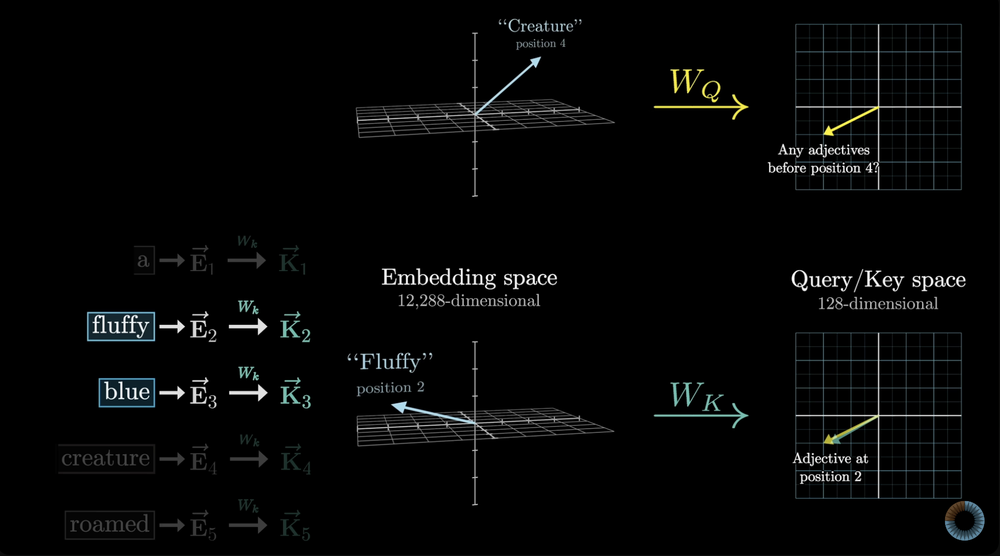

In [13]:
display(Image(filename='assets/16-queryKey2.png', width=700, height=700))

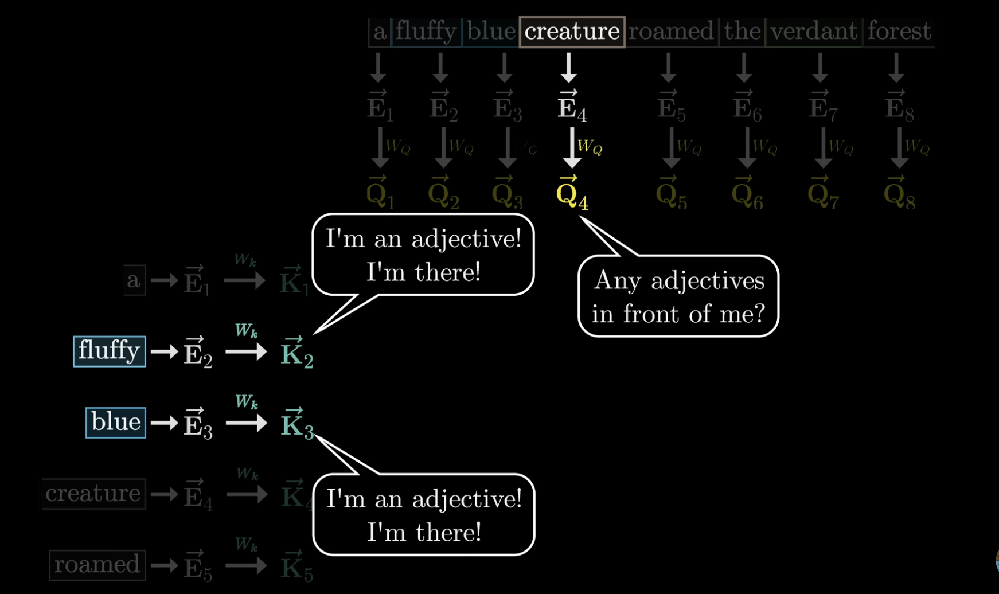

In [14]:
display(Image(filename='assets/15-queryKey1.png', width=700, height=700))

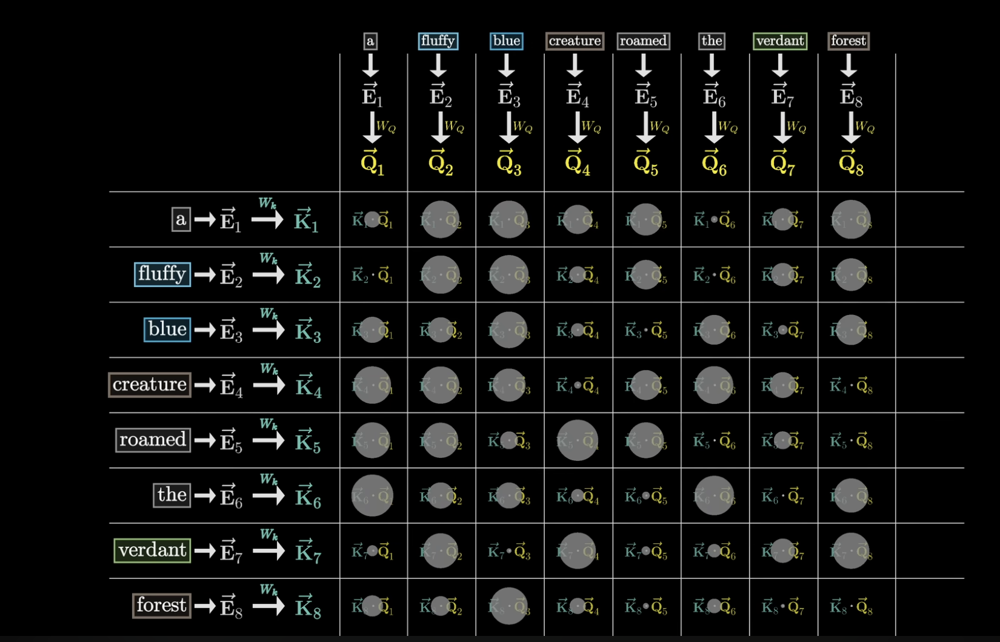

In [15]:
display(Image(filename='assets/17-qKmatrix1.png', width=700, height=700))

The higher the dot product (in this image, the large the circle), the more **relevant** the Query to the Key (i.e. word to another word in the sentence)

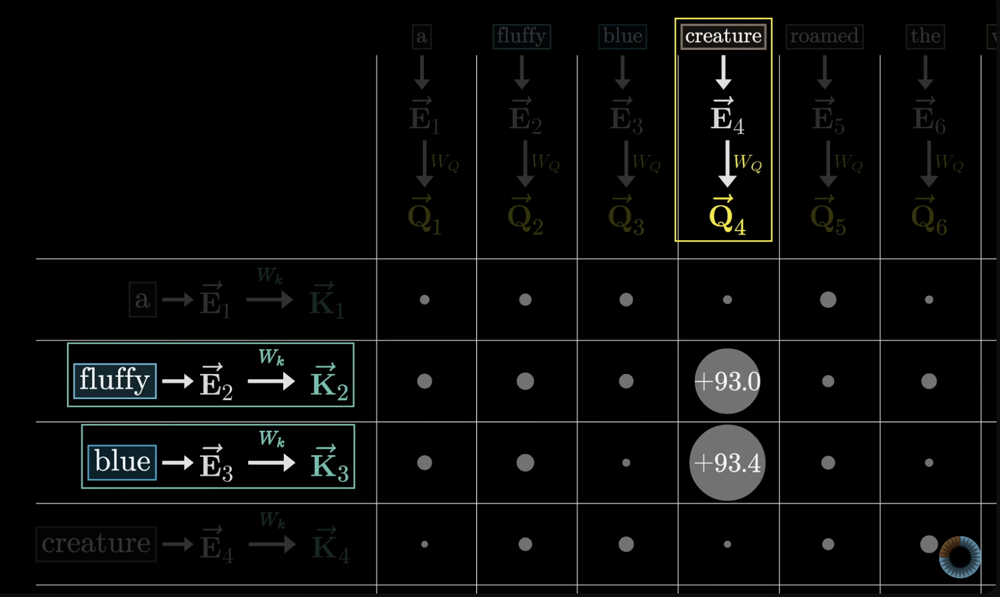

In [16]:
display(Image(filename='assets/18-qKmatrix2.png', width=700, height=700))

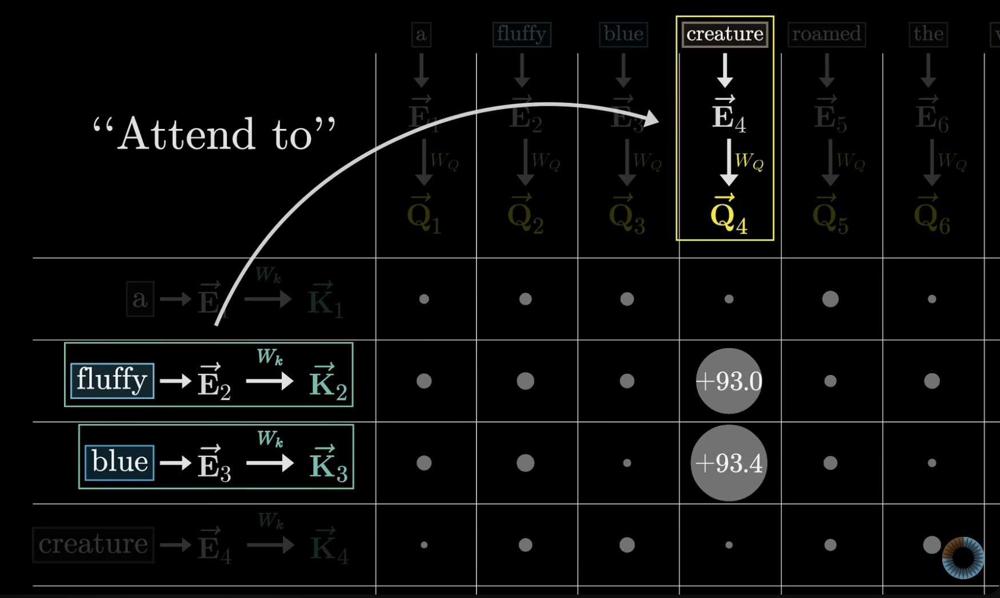

In [17]:
display(Image(filename='assets/19-qKmatrix3.png', width=700, height=700))

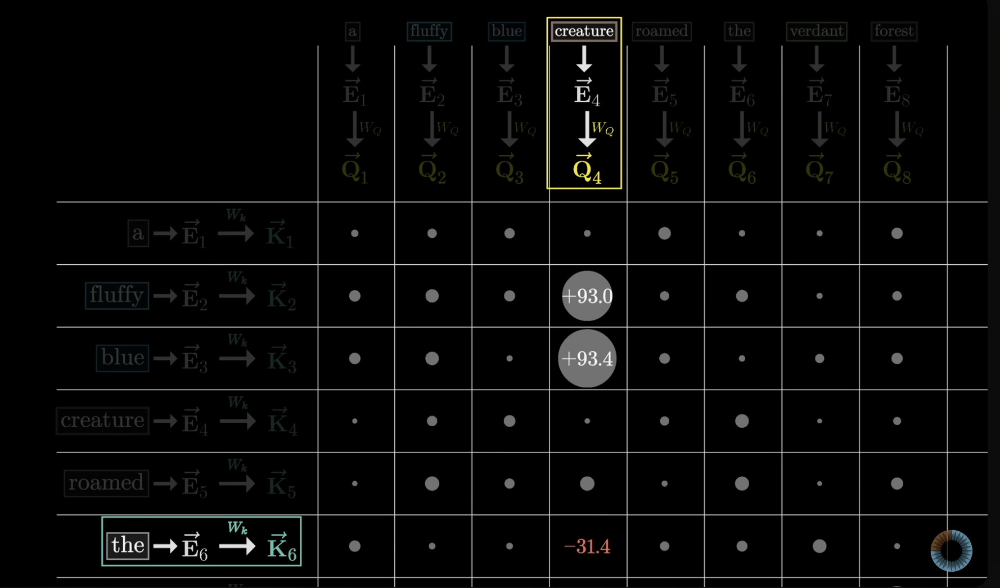

In [18]:
display(Image(filename='assets/20-qKmatrix4.png', width=700, height=700))

### Masking

Masking is to prevent later tokens influencing earlier ones during the training process. This is done by setting the entries of the older tokens to -infinity. So when softmax is applied, they are turned to 0.

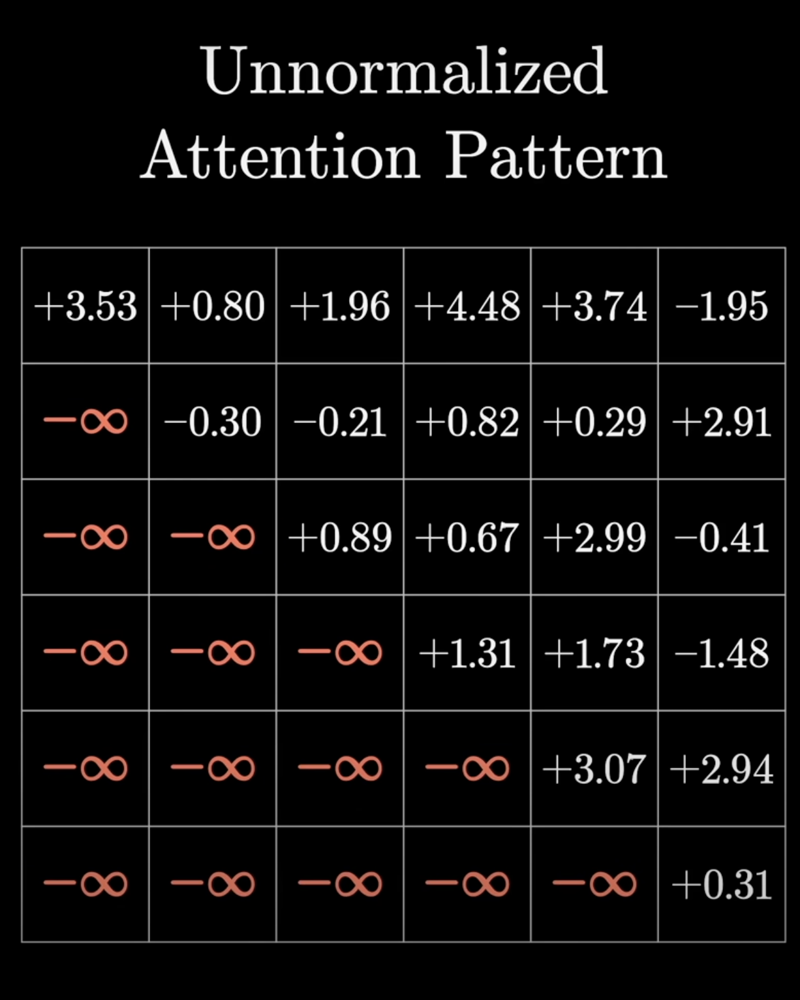

In [19]:
display(Image(filename='assets/23-masking.png', width=300, height=300))

### Why mask?

During the train process, every possible subsequence is trained/predicted on for efficiency.<br>
One training example, effectively acts as many.<br>
This means we **never want to allow later words to influence earlier words** (because they essentially "give away" the answer for what comes next/the answer to the predictions)



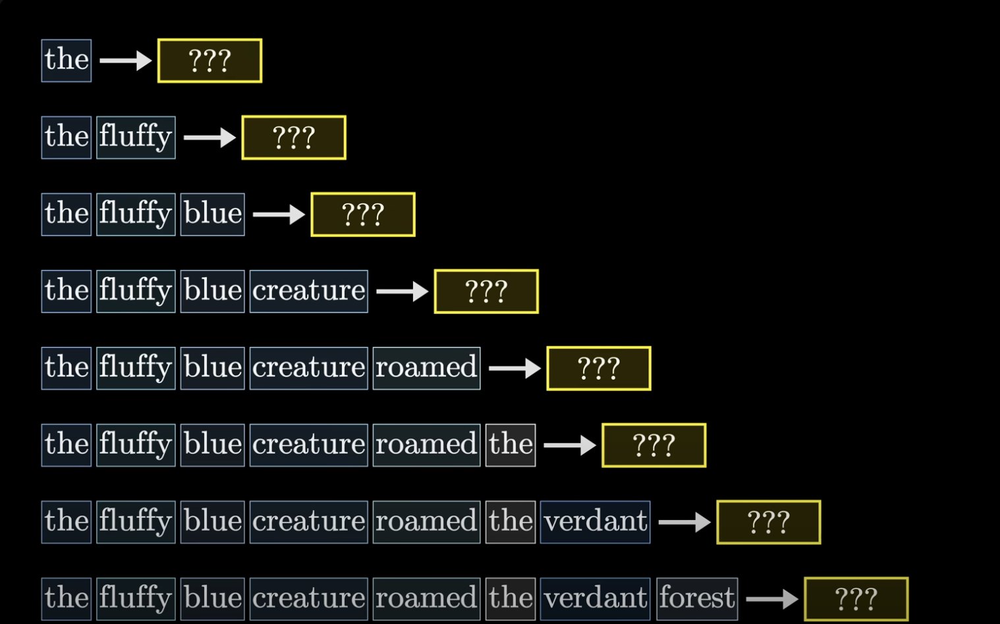

In [20]:
display(Image(filename='assets/21-subsequenceTraining.png', width=500, height=500))

### Softmax

After masking, softmax (normalization) is applied. Masking was done to ensure that later tokens do not affect earlier tokens in the training process. So, the older tokens' entries are set to -infinity during the masking phase, **to be transformed into 0 with softmax**.

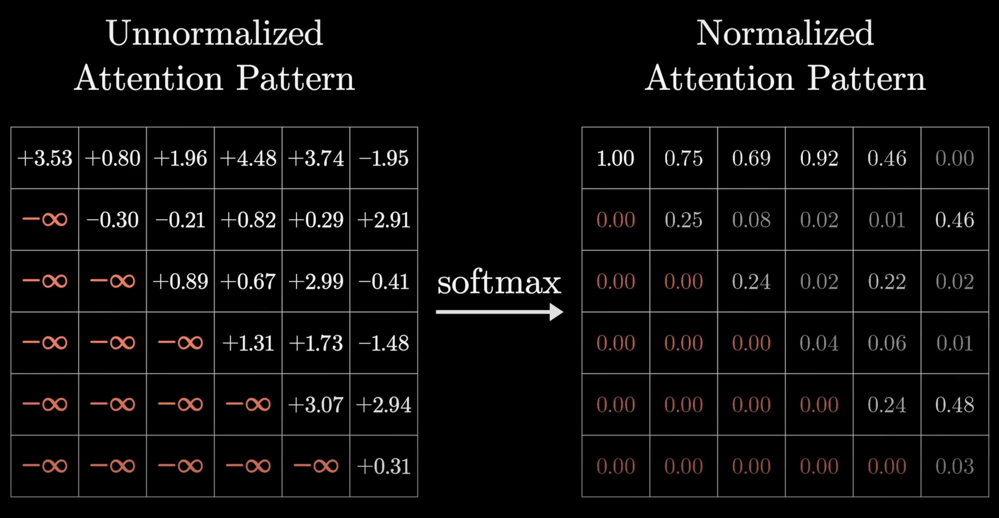

In [21]:
display(Image(filename='assets/22-maskingANDsoftmax.png', width=500, height=500))

### Value
Value matrix `W_v` is multiplied by the embedding of a word, and this is added to the embedding of the next word
<br><br>
Values essentially answer: *IF a word is relevant to adjusting the meaning of something, what exactly should be added to the embedding of that something else, in order to reflect this?*
<br><br>
- `Value`: vector that holds the actual info that will be passed along the next layer of the network if a word is deemed relevant based on the attention scores
    - after computing the attention scores, these scores are used to weigh the Values
    
        - **the weighted sum of these Values is then used as the output for the current word**
    <br>
    - continuing with the sentence "The cat sat on the mat", if "sat" (Key) is deemed important for "cat" (Query), **the Value associated with "sat" will contribute significantly to the final representation of "cat"**
        - this helps the model understand that "cat" is related to the action of "sitting"

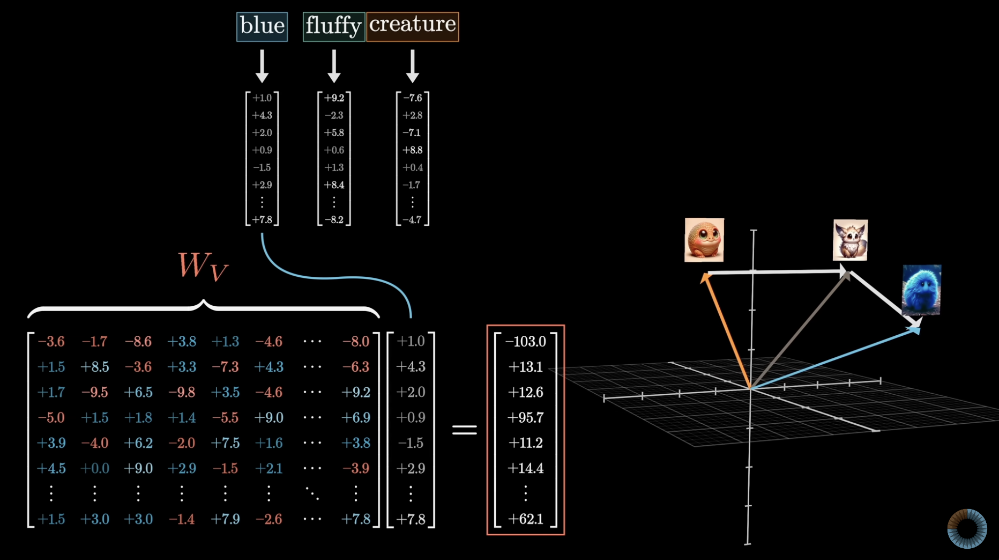

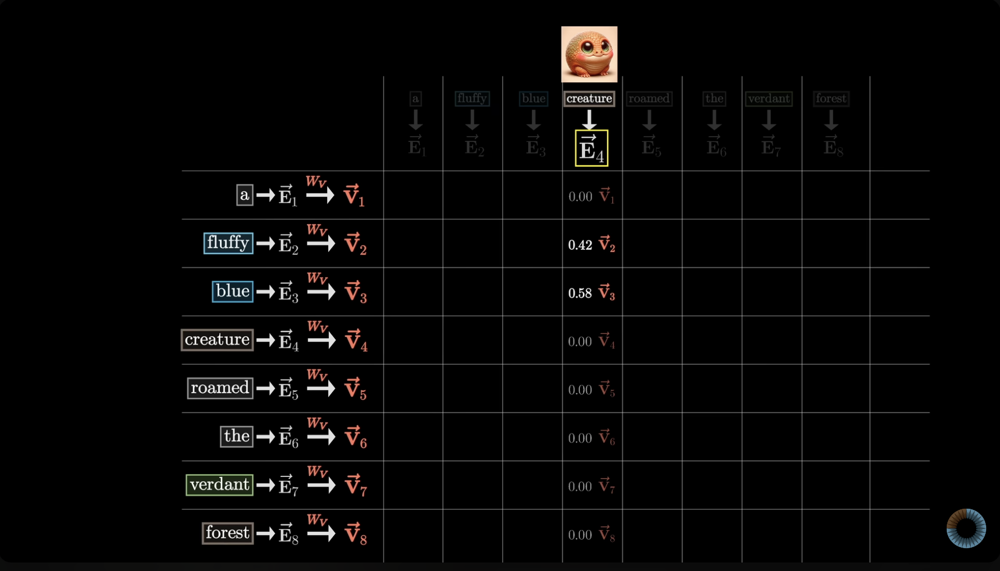

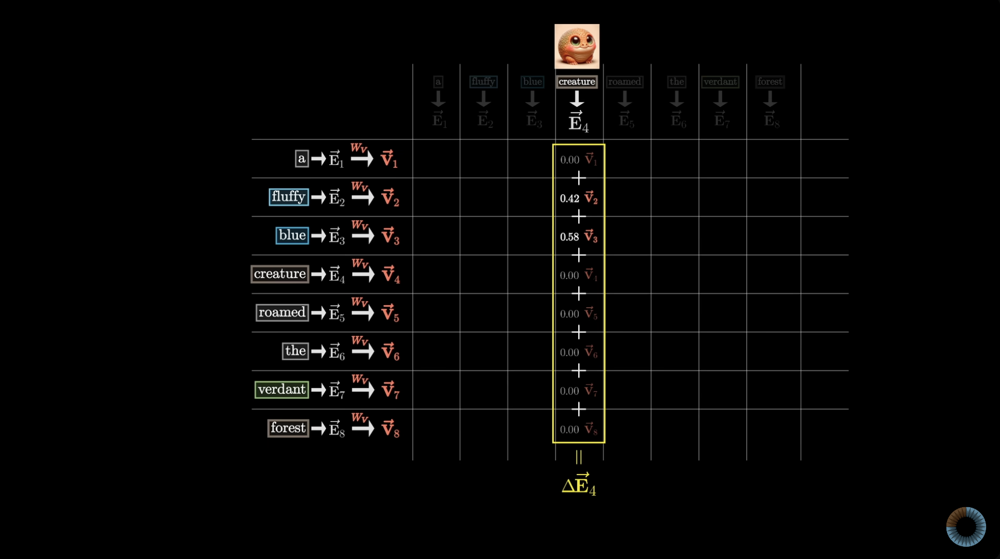

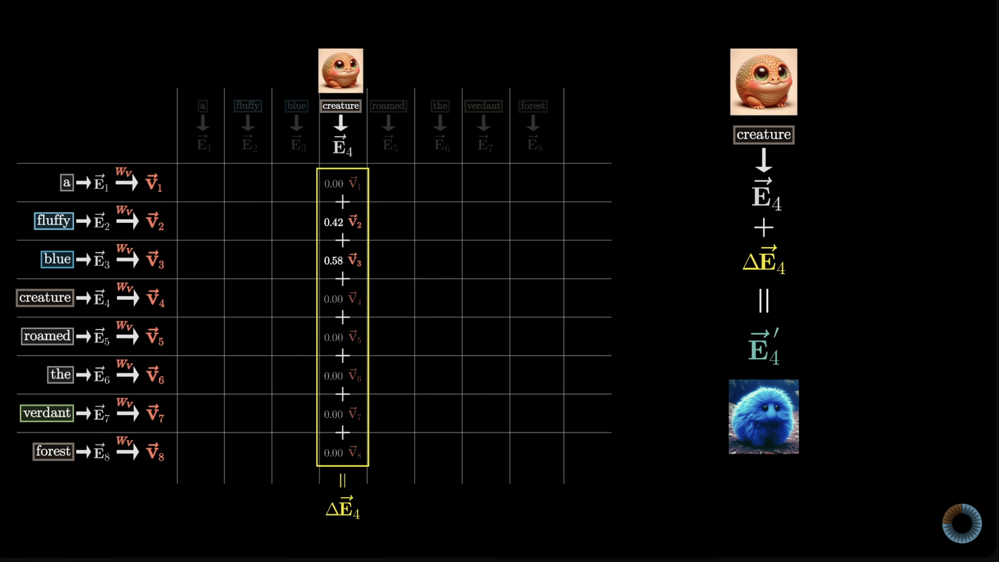

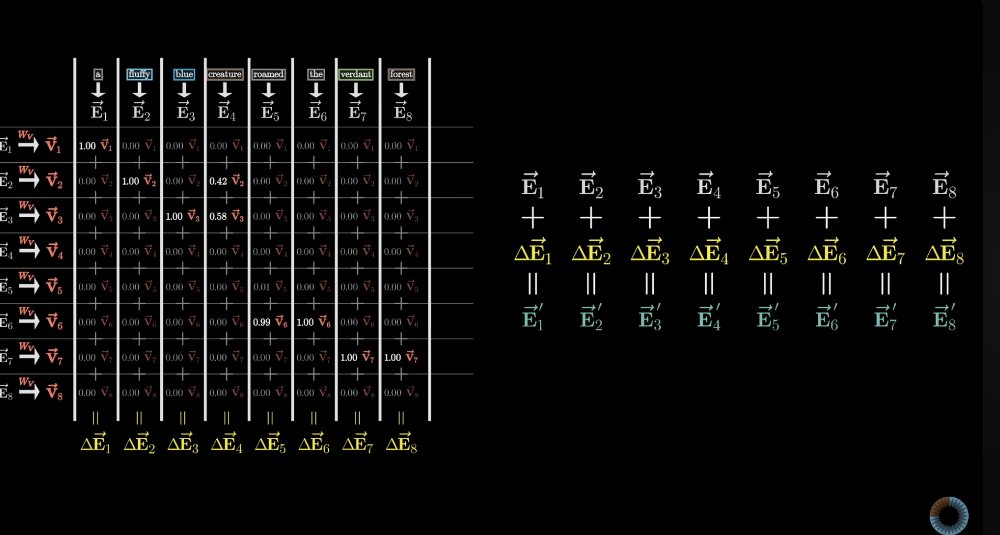

In [22]:
display(Image(filename='assets/24-valueMatrix.png', width=700, height=700))
display(Image(filename='assets/25-valueEmbedding1.png', width=700, height=700))
display(Image(filename='assets/26-valueEmbedding2.png', width=700, height=700))
display(Image(filename='assets/27-valueEmbedding3.png', width=700, height=700))
display(Image(filename='assets/28-valueEmbedding4.png', width=700, height=700))

### Multi-Head Attention

An Attention block is made up of many Attention heads running in parallel (multi-headed attention)

**By running many distinct heads in parallel, we are giving the model the capacity to learn many distinct ways that context changes meaning**

In other words, multiple instances of Self Attention class running in parallel, each instance with different weight matrices

Steps:  
1. Declare multiple heads/instances of Self Attention running in parallel  
   Each head/instance of Self Attention class focuses on different parts of the input by having its own set of weight matrices (W_q, W_k, W_v)  
2. Each heads/instances of Self Attention's output is concatenated along the embedding dimension (input of each Self Attention class)  
3. Concatenated output is passed through a final linear transformation (a weight matrix)  
   To combine the information from all heads into a single output

**Why Concatenate and Apply a Final Linear Transformation?**
<br><br>

The reason for concatenating the outputs from all heads is that each head has learned something different about the input. By concatenating, we combine these insights into a single, unified representation
<br><br>
The final linear transformation is applied to this concatenated output to bring it back to the original embedding dimension

### a. Concatenation

In multi-head attention, each head learns **different aspects of the input** because each head operates on a different part of the embedding (`head_dim`). By concatenating the outputs from all the heads, we are combining these different learned representations into a single vector that encapsulates all these different insights

### b. Final linear transformation 

The final linear transformation, done using a weight matrix, mixes the information from the different heads back into a single vector of the original `embedding_dim`. This step is crucial because it allows the model to create a unified representation that integrates the different perspectives learned by each head

*Credit to 3blue1brown for the visuals!*